<a id=toc></a>
<h1 style="padding: 35px;color:white;margin:10;font-size:200%;text-align:center;display:fill;border-radius:10px;overflow:hidden;background-image: url(https://i.postimg.cc/fTDmwnkQ/Miaka.png); background-size: 100% auto;background-position: 0px 0px; 
"><span style='color:white'><b> Disease classification Using CNN & INceptionV3 </b></span></h1>

<br>

<center>
    <img src="https://cdn.medizzy.com/vV1Fa3PjhBQ9G3jPkzGAy2CITWQ=/img/posts/4769fd6f-0149-4420-a9fd-6f01493420bd" 
         alt ="Flood" 
         style='width: 60%;'>
    <figcaption>
            Source: <a href='https://cdn.medizzy.com/vV1Fa3PjhBQ9G3jPkzGAy2CITWQ=/img/posts/4769fd6f-0149-4420-a9fd-6f01493420bd'> medizzy.com | Diabetic Retinopathy Image</a>
    </figcaption>
</center>

## 🎯 Objective
We need to create a multiclass classification model that classify the given images in their corresponding classes

<br>

<hr>

## Table of contents

- [1 | Importing Required Libraries & DataSource](#1)

- [2 | Data Analysis and Preparation](#2)
   > - [Reading the csv file](#2.1)
   > - [Reading the csv file](#2.2)
   > - [Checking Unique Values in the 'diagnosis' column](#2.3)
   > - [Counting Total number of image in given image directory](#2.4)
   > - [Creating New Floder to separate the image corresponding to their Label](#2.5)
   > - [Splitting into Train and test](#2.6)
   
- [3 | Exploratory Data Analysis](#3)
   > - [Visualising Data Sample of all classes](#3.1)
   > - [Visualising Data Distribution in classes](#3.2)
   > - [Checking variation in image Dimension](#3.3)
   > - [Checking variation in image Intensity](#3.4)
   > - [Checking the aspect ratio of the images to ensure consistency](#3.5)
   
   
- [4 | Preprocessing](#4)
   > - [Data Augmentation and preprocessing of training data and Testing data](#4.1)

- [5 | Model Building](#5)
   > - [Baseline Model Building](#5.1)
   > - [Baseline Madel Evaluation](#5.2)
   > - [Transfer Learning InceptionV3](#5.3)
   > - [Evaluating InceptionV3 Model](#5.4)
   > - [Comparing Both Model](#5.5)
   > - [Prediction On random samples](#5.6)

<br>

<hr>

# Author Details:
- **Name: Anmol Gupta**
- **Email: getanmol.gupta@gmail.com**
- **LinkedIn: www.linkedin.com/in/anmol-gupta-9a905a228**
- **GitHub: https://github.com/anmolgupta01**


<center><div style='color:#ffffff;
           display:inline-block;
           padding: 5px 5px 5px 5px;
           border-radius:5px;
           background-color:#78D1E1;
           font-size:100%;'><a href=#toc style='text-decoration: none; color:#03001C;'>⬆️ Back To Top</a></div></center>

<a id='1'></a>
# 1 | Importing Required Libraries & DataSource

<div style="padding: 4px;color:white;margin:10;font-size:200%;text-align:center;display:fill;border-radius:10px;overflow:hidden;background-image: url(https://i.postimg.cc/fTDmwnkQ/Miaka.png); background-size: 100% auto;"></div>


In [1]:
# Importing Standard libraries
import os
import cv2
import random
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
from PIL import Image
from skimage import exposure
import warnings
warnings.filterwarnings('ignore')

#Importing Sklearn Libraries
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split

#Importing TensorFlow and Keras Library
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Activation, Dropout, BatchNormalization, GlobalAveragePooling2D, InputLayer
from tensorflow.keras.optimizers import Adam, Adadelta
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import InceptionV3

#importing Keras Tuner
import keras_tuner


for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

2024-05-22 13:41:50.765556: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-22 13:41:50.765667: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-22 13:41:50.936992: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


/kaggle/input/cleaned-data/cleaned_data/test/2/007-4904-300.jpg
/kaggle/input/cleaned-data/cleaned_data/test/2/007-3010-100.jpg
/kaggle/input/cleaned-data/cleaned_data/test/2/007-4083-200.jpg
/kaggle/input/cleaned-data/cleaned_data/test/2/007-5343-300.jpg
/kaggle/input/cleaned-data/cleaned_data/test/2/007-4167-200.jpg
/kaggle/input/cleaned-data/cleaned_data/test/2/007-2556-100.jpg
/kaggle/input/cleaned-data/cleaned_data/test/2/007-3547-200.jpg
/kaggle/input/cleaned-data/cleaned_data/test/2/007-3527-200.jpg
/kaggle/input/cleaned-data/cleaned_data/test/2/007-5285-300.jpg
/kaggle/input/cleaned-data/cleaned_data/test/2/007-3026-100.jpg
/kaggle/input/cleaned-data/cleaned_data/test/2/007-5471-300.jpg
/kaggle/input/cleaned-data/cleaned_data/test/2/007-5783-300.jpg
/kaggle/input/cleaned-data/cleaned_data/test/2/007-4048-200.jpg
/kaggle/input/cleaned-data/cleaned_data/test/2/007-4817-300.jpg
/kaggle/input/cleaned-data/cleaned_data/test/2/007-5474-300.jpg
/kaggle/input/cleaned-data/cleaned_data/

<center><div style='color:#ffffff;
           display:inline-block;
           padding: 5px 5px 5px 5px;
           border-radius:5px;
           background-color:#78D1E1;
           font-size:100%;'><a href=#toc style='text-decoration: none; color:#03001C;'>⬆️ Back To Top</a></div></center>

<a id='2'></a>
# 2 | Data Analysis and Preparation

<div style="padding: 4px;color:white;margin:10;font-size:200%;text-align:center;display:fill;border-radius:10px;overflow:hidden;background-image: url(https://i.postimg.cc/fTDmwnkQ/Miaka.png); background-size: 100% auto;"></div>


<a id='2.1'></a>
## **Reading the csv file**

In [2]:
df = pd.read_csv('/kaggle/input/retinal-disease-detection/upbrain_tech/DR_grading_labels.csv')

In [3]:
df

,id_code,diagnosis
0,20170413102628830.jpg,0
1,20170413111955404.jpg,0
2,20170413112015395.jpg,0
3,20170413112017305.jpg,0
4,20170413112528859.jpg,0
...,...,...
12517,007-6761-400.jpg,4
12518,007-6762-400.jpg,4
12519,007-6763-400.jpg,4
12520,007-6764-400.jpg,4


<center><div style='color:#ffffff;
           display:inline-block;
           padding: 5px 5px 5px 5px;
           border-radius:5px;
           background-color:#78D1E1;
           font-size:100%;'><a href=#toc style='text-decoration: none; color:#03001C;'>⬆️ Back To Top</a></div></center>
           
<a id='2.2'></a>
## **Computing dataset Shape**

In [4]:
print("dataset shape: ",df.shape)

dataset shape:  (12522, 2)


<a id='2.3'></a>
## **Checking Unique Values in the 'diagnosis' column**

In [5]:
df['diagnosis'].unique()

array([0, 1, 2, 3, 4])

<a id='2.4'></a>
## **Counting Total number of image in given image directory**

In [6]:
# Define the source directory containing the images
source_dir = '/kaggle/input/retinal-disease-detection/upbrain_tech/DR_grading/'

# Initialize the count of images
total_images = 0

# Iterate over each file in the directory
for filename in os.listdir(source_dir):
    # Check if the file is an image
    if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
        total_images += 1

print(f"Total number of images in {source_dir}: {total_images}")


Total number of images in /kaggle/input/retinal-disease-detection/upbrain_tech/DR_grading/: 5738


<div style="border-radius:10px; border:#808080 dashed; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=brown> 🔍 Inference:</font></h3>

- **Since the Total Number of Image in the given file is 5738 and 12522 file names were given in the csv file , that shows that there is the mismatch in no. of images** 

<center><div style='color:#ffffff;
           display:inline-block;
           padding: 5px 5px 5px 5px;
           border-radius:5px;
           background-color:#78D1E1;
           font-size:100%;'><a href=#toc style='text-decoration: none; color:#03001C;'>⬆️ Back To Top</a></div></center>

<a id='3.5'></a>
## **Creating New Floder to separate the image corresponding to their Label**

In [7]:
# Define the base directory for the new folders
base_dir = '/kaggle/working/'

# Create directories for each label
label_folders = ['0', '1', '2', '3', '4']
for folder in label_folders:
    os.makedirs(os.path.join(base_dir, folder), exist_ok=True)


In [8]:
# Define the source directory containing the images
source_dir = '/kaggle/input/retinal-disease-detection/upbrain_tech/DR_grading/'

# Iterate over the DataFrame rows
for index, row in df.iterrows():
    image_id = row['id_code']
    label = str(row['diagnosis'])  # Convert label to string for folder name
    
    # Define the source file path
    source_file = os.path.join(source_dir, image_id)
    
    # Define the destination folder path
    dest_folder = os.path.join(base_dir, label)
    
    # Copy the file to the destination folder
    if os.path.exists(source_file):
        shutil.copy(source_file, dest_folder)

print("Images have been copied to respective folders successfully.")


Images have been copied to respective folders successfully.


In [9]:
# Initialize the count of images for each label and the total count
label_counts = {}
total_images = 0

# Define valid image extensions
valid_extensions = ('.png', '.jpg', '.jpeg', '.gif', '.bmp')

# Iterating over each folder in the base directory
for label_folder in os.listdir(base_dir):
    folder_path = os.path.join(base_dir, label_folder)
    
    # Checking if the path is a directory
    if os.path.isdir(folder_path):
        # Initialize the count for this label
        label_counts[label_folder] = 0
        
        # Iterating over each file in the label folder
        for filename in os.listdir(folder_path):
            # Checking if the file is an image
            if filename.lower().endswith(valid_extensions):
                label_counts[label_folder] += 1
                total_images += 1

for label, count in label_counts.items():
    print(f"Number of images in folder '{label}': {count}")

print(f"Total number of images in {base_dir}: {total_images}")


Number of images in folder '4': 14
Number of images in folder '3': 176
Number of images in folder '2': 3255
Number of images in folder '0': 1696
Number of images in folder '1': 597
Total number of images in /kaggle/working/: 5738


In [10]:
# Define the base directory
base_dir = '/kaggle/working/'

# Creating train and test directories
train_dir = os.path.join(base_dir, 'train')
test_dir = os.path.join(base_dir, 'test')
os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

# Define valid image extensions
valid_extensions = ('.png', '.jpg', '.jpeg', '.gif', '.bmp')

# Function to create label folders in a given directory
def create_label_folders(base_path, labels):
    for label in labels:
        os.makedirs(os.path.join(base_path, label), exist_ok=True)

# Get all label folders from the base directory
label_folders = [d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d)) and d.isdigit()]

# Create label folders in train and test directories
create_label_folders(train_dir, label_folders)
create_label_folders(test_dir, label_folders)

# Iterate over each label folder and split images into train and test sets
for label_folder in label_folders:
    folder_path = os.path.join(base_dir, label_folder)
    images = [f for f in os.listdir(folder_path) if f.lower().endswith(valid_extensions)]
    
    # Shuffle images
    random.shuffle(images)
    
    # Calculate split index
    split_idx = int(len(images) * 0.8)
    
    # Split images
    train_images = images[:split_idx]
    test_images = images[split_idx:]
    
    # Move train images
    for img in train_images:
        src = os.path.join(folder_path, img)
        dst = os.path.join(train_dir, label_folder, img)
        shutil.move(src, dst)
    
    # Move test images
    for img in test_images:
        src = os.path.join(folder_path, img)
        dst = os.path.join(test_dir, label_folder, img)
        shutil.move(src, dst)

print("Images have been split into train and test sets successfully.")


Images have been split into train and test sets successfully.


<center><div style='color:#ffffff;
           display:inline-block;
           padding: 5px 5px 5px 5px;
           border-radius:5px;
           background-color:#78D1E1;
           font-size:100%;'><a href=#toc style='text-decoration: none; color:#03001C;'>⬆️ Back To Top</a></div></center>
           
<a id='2.6'></a>
## **Spliting the data in train and test**

In [11]:
# List of directories to keep
keep_dirs = ['train', 'test']

# Iterate over each item in the base directory
for item in os.listdir(base_dir):
    item_path = os.path.join(base_dir, item)
    
    # Check if the item is not in the keep list and exists
    if item not in keep_dirs:
        # If the item is a directory, delete it and its contents
        if os.path.isdir(item_path):
            shutil.rmtree(item_path)
            print(f"Deleted directory: {item_path}")
        # If the item is a file, delete it
        elif os.path.isfile(item_path):
            os.remove(item_path)
            print(f"Deleted file: {item_path}")

print("Unnecessary folders and files have been deleted successfully.")


Deleted directory: /kaggle/working/4
Deleted directory: /kaggle/working/3
Deleted directory: /kaggle/working/2
Deleted directory: /kaggle/working/0
Deleted file: /kaggle/working/__notebook__.ipynb
Deleted directory: /kaggle/working/1
Unnecessary folders and files have been deleted successfully.


<center><div style='color:#ffffff;
           display:inline-block;
           padding: 5px 5px 5px 5px;
           border-radius:5px;
           background-color:#78D1E1;
           font-size:100%;'><a href=#toc style='text-decoration: none; color:#03001C;'>⬆️ Back To Top</a></div></center>

<a id='3'></a>
# 3 | Exploratory Data Analysis

<div style="padding: 4px;color:white;margin:10;font-size:200%;text-align:center;display:fill;border-radius:10px;overflow:hidden;background-image: url(https://i.postimg.cc/fTDmwnkQ/Miaka.png); background-size: 100% auto;"></div>


<a id='3.1'></a>
## **Visualising Data Sample of all classes**

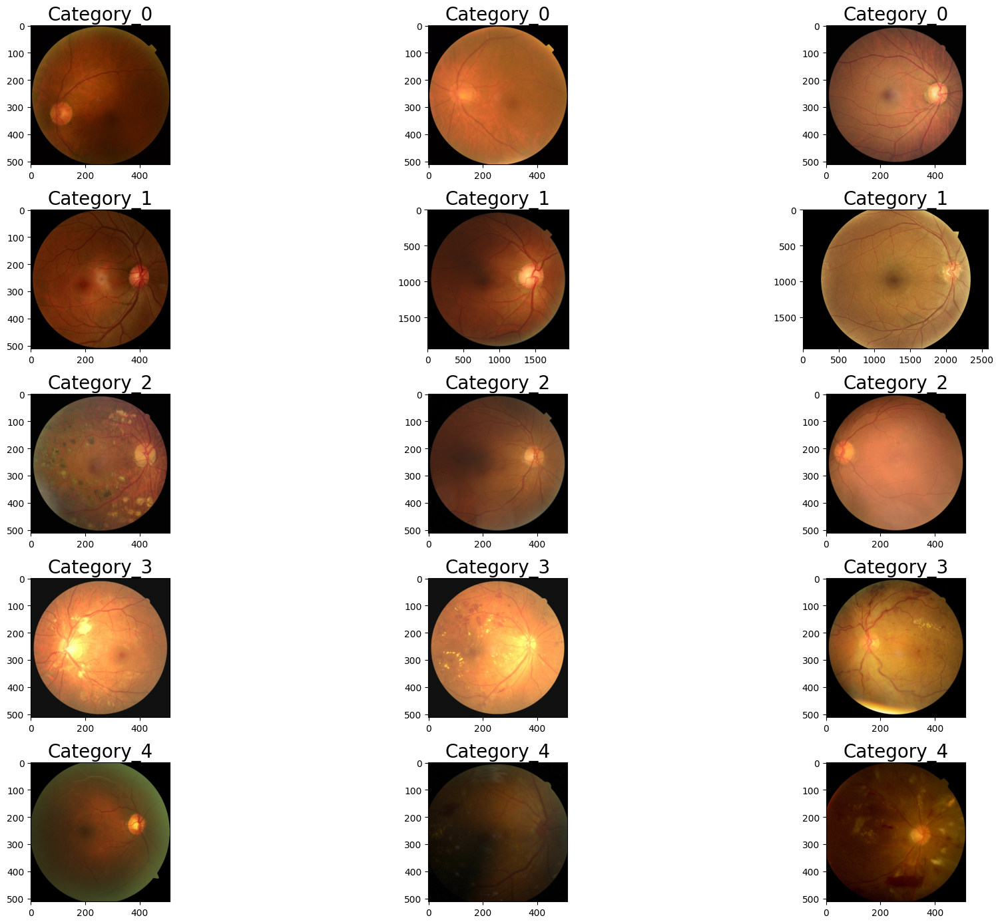

In [12]:
path_0 = '/kaggle/working/train/0'
path_1 = '/kaggle/working/train/1'
path_2 = '/kaggle/working/train/2'
path_3 = '/kaggle/working/train/3'
path_4 = '/kaggle/working/train/4'


image_files0 = [os.path.join(path_0, filename) for filename in os.listdir(path_0)]
image_files1 = [os.path.join(path_1, filename) for filename in os.listdir(path_1)]
image_files2 = [os.path.join(path_2, filename) for filename in os.listdir(path_2)]
image_files3 = [os.path.join(path_3, filename) for filename in os.listdir(path_3)]
image_files4 = [os.path.join(path_4, filename) for filename in os.listdir(path_4)]



num_samples = 3

selected_images0 = random.sample(image_files0, num_samples)
selected_images1 = random.sample(image_files1, num_samples)
selected_images2 = random.sample(image_files2, num_samples)
selected_images3 = random.sample(image_files3, num_samples)
selected_images4 = random.sample(image_files4, num_samples)

#create subplots for displaying images
fig, axes = plt.subplots(5, num_samples, figsize=(20,14))

# Display each selected image from the first directory
for i, image_path in enumerate(selected_images0):
    ax = axes[0, i]
    img = mpimg.imread(image_path)
    ax.imshow(img)
    ax.set_title('Category_0', fontsize=20)  
    ax.axis('on')  

# Display each selected image from the second directory
for i, image_path in enumerate(selected_images1):
    ax = axes[1, i]
    img = mpimg.imread(image_path)
    ax.imshow(img)
    ax.set_title('Category_1', fontsize=20)  
    ax.axis('on')  
    
for i, image_path in enumerate(selected_images2):
    ax = axes[2, i]
    img = mpimg.imread(image_path)
    ax.imshow(img)
    ax.set_title('Category_2', fontsize=20)  
    ax.axis('on')  

# Display each selected image from the second directory
for i, image_path in enumerate(selected_images3):
    ax = axes[3, i]
    img = mpimg.imread(image_path)
    ax.imshow(img)
    ax.set_title('Category_3', fontsize=20)  
    ax.axis('on')  
    
# Display each selected image from the second directory
for i, image_path in enumerate(selected_images4):
    ax = axes[4, i]
    img = mpimg.imread(image_path)
    ax.imshow(img)
    ax.set_title('Category_4', fontsize=20)  
    ax.axis('on')  
    
plt.tight_layout()  
plt.show()


<center><div style='color:#ffffff;
           display:inline-block;
           padding: 5px 5px 5px 5px;
           border-radius:5px;
           background-color:#78D1E1;
           font-size:100%;'><a href=#toc style='text-decoration: none; color:#03001C;'>⬆️ Back To Top</a></div></center>

<a id='3.2'></a>
## **Visualising Data Distribution in all classes**

In [13]:
train_dir = "/kaggle/working/train"

category_counts = {"0": 0, "1": 0, "2": 0, "3": 0, "4": 0}

# Loop through each class directory and count the number of samples
for class_name in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_name)
    if os.path.isdir(class_path) and class_name in category_counts:
        category_counts[class_name] += len(os.listdir(class_path))

# Print the counts for each class
for category, count in category_counts.items():
    print(f"Number of samples in {category} class: {count}")

print('-'*50)

total_samples = sum(category_counts.values())

imbalance_ratios = {category: count / total_samples for category, count in category_counts.items()}

for category, ratio in imbalance_ratios.items():
    print(f"Imbalance ratio for {category} class: {ratio:.2f}")


Number of samples in 0 class: 1356
Number of samples in 1 class: 477
Number of samples in 2 class: 2604
Number of samples in 3 class: 140
Number of samples in 4 class: 11
--------------------------------------------------
Imbalance ratio for 0 class: 0.30
Imbalance ratio for 1 class: 0.10
Imbalance ratio for 2 class: 0.57
Imbalance ratio for 3 class: 0.03
Imbalance ratio for 4 class: 0.00


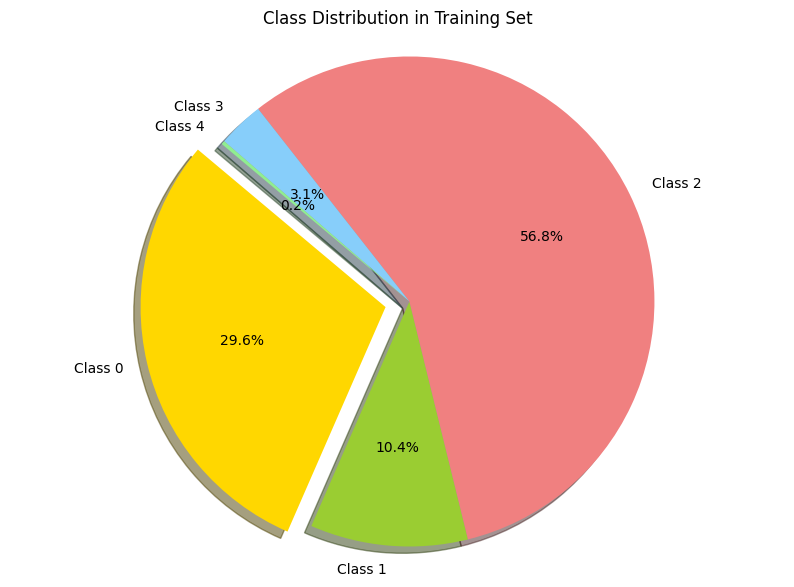

In [14]:
labels = [f'Class {category}' for category in category_counts.keys()]
sizes = category_counts.values()
colors = ['gold', 'yellowgreen', 'lightcoral', 'lightskyblue', 'lightgreen']
explode = (0.1, 0, 0, 0, 0)  

plt.figure(figsize=(10, 7))
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%', shadow=True, startangle=140)
plt.axis('equal') 

plt.title('Class Distribution in Training Set')
plt.show()

<div style="border-radius:10px; border:#808080 dashed; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=brown> 🔍 Inference:</font></h3>

- **Since the class Distribution is not same our data is imbalanced** 

<center><div style='color:#ffffff;
           display:inline-block;
           padding: 5px 5px 5px 5px;
           border-radius:5px;
           background-color:#78D1E1;
           font-size:100%;'><a href=#toc style='text-decoration: none; color:#03001C;'>⬆️ Back To Top</a></div></center>

<a id='3.3'></a>
## **Checking variation in image Dimension**

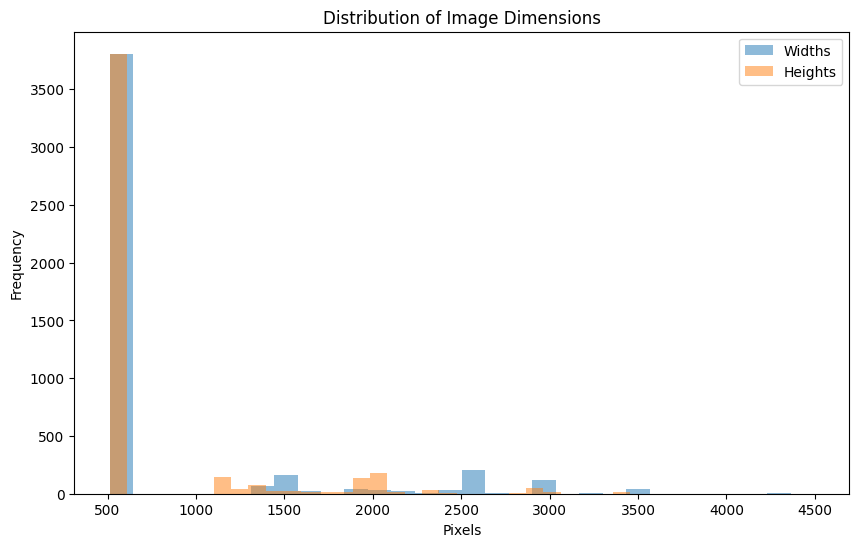

In [15]:
image_dimensions = []

for class_name in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_name)
    if os.path.isdir(class_path):
        for image_name in os.listdir(class_path):
            image_path = os.path.join(class_path, image_name)
            with Image.open(image_path) as img:
                image_dimensions.append(img.size)

# Plot image dimensions
widths, heights = zip(*image_dimensions)

plt.figure(figsize=(10, 6))
plt.hist(widths, bins=30, alpha=0.5, label='Widths')
plt.hist(heights, bins=30, alpha=0.5, label='Heights')
plt.xlabel('Pixels')
plt.ylabel('Frequency')
plt.title('Distribution of Image Dimensions')
plt.legend(loc='upper right')
plt.show()


<center><div style='color:#ffffff;
           display:inline-block;
           padding: 5px 5px 5px 5px;
           border-radius:5px;
           background-color:#78D1E1;
           font-size:100%;'><a href=#toc style='text-decoration: none; color:#03001C;'>⬆️ Back To Top</a></div></center>

<a id='3.4'></a>
## **Checking variation in image Intensity**

In [16]:
from scipy.stats import skew

def plot_intensity_distribution(train_dir, class_name):
    class_path = os.path.join(train_dir, class_name)
    intensities = []
    
    for image_name in os.listdir(class_path):
        image_path = os.path.join(class_path, image_name)
        with Image.open(image_path) as img:
            intensities.append(np.array(img).flatten())
    
    intensities = np.concatenate(intensities)
    plt.figure(figsize=(10, 6))
    plt.hist(intensities, bins=256, range=(0, 256), alpha=0.75, color='blue')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.title(f'Pixel Intensity Distribution for Class {class_name}')
    plt.show()

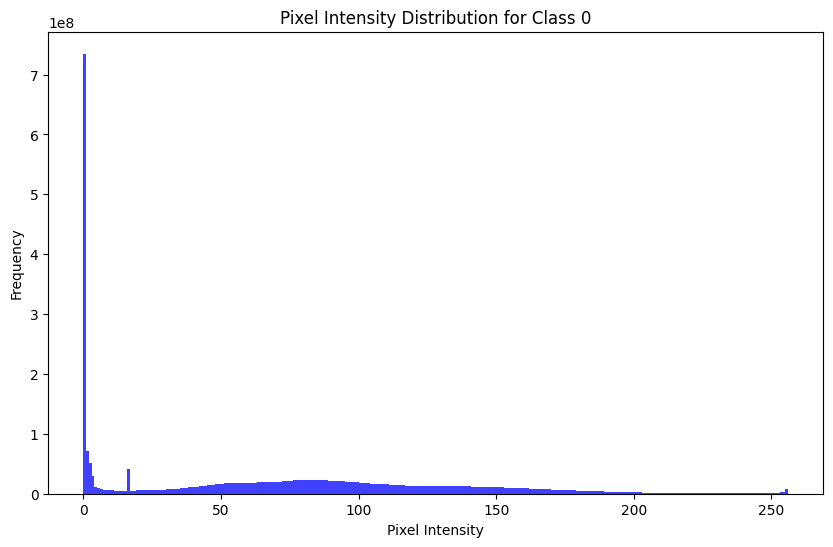

In [17]:
plot_intensity_distribution(train_dir, '0')

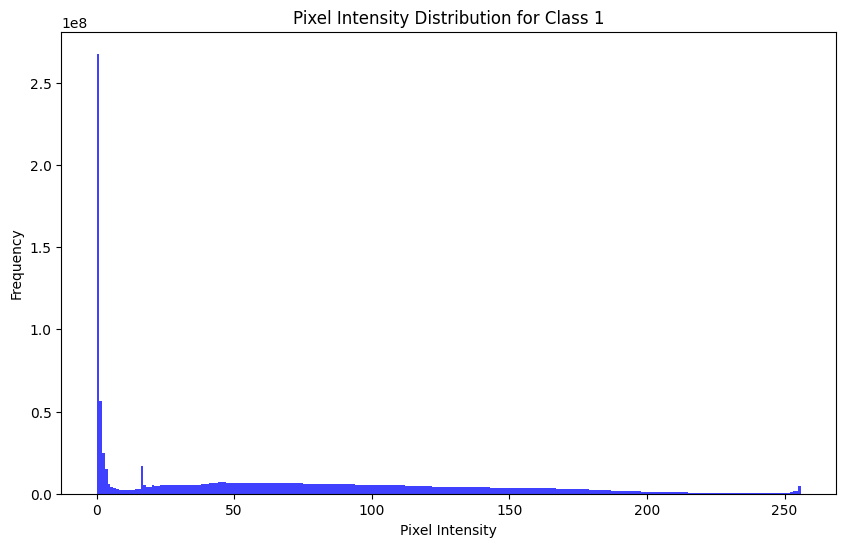

In [18]:
plot_intensity_distribution(train_dir, '1')

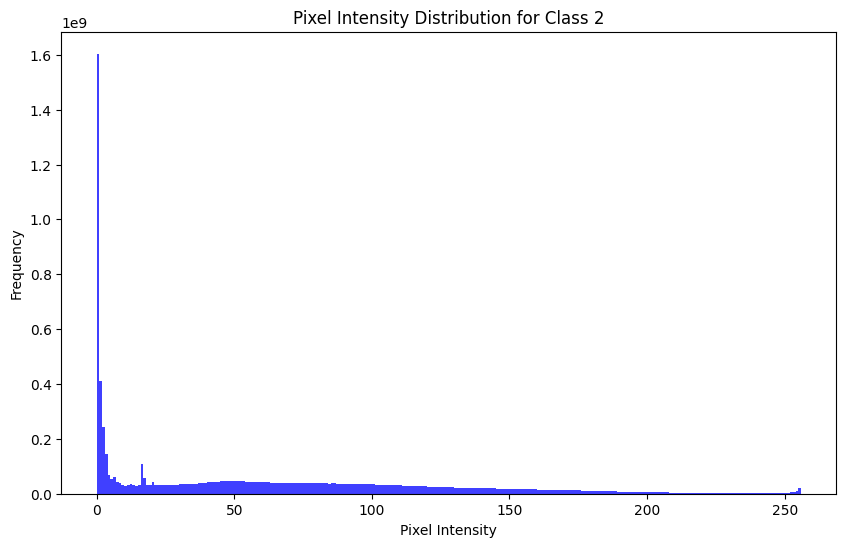

In [19]:
plot_intensity_distribution(train_dir, '2')

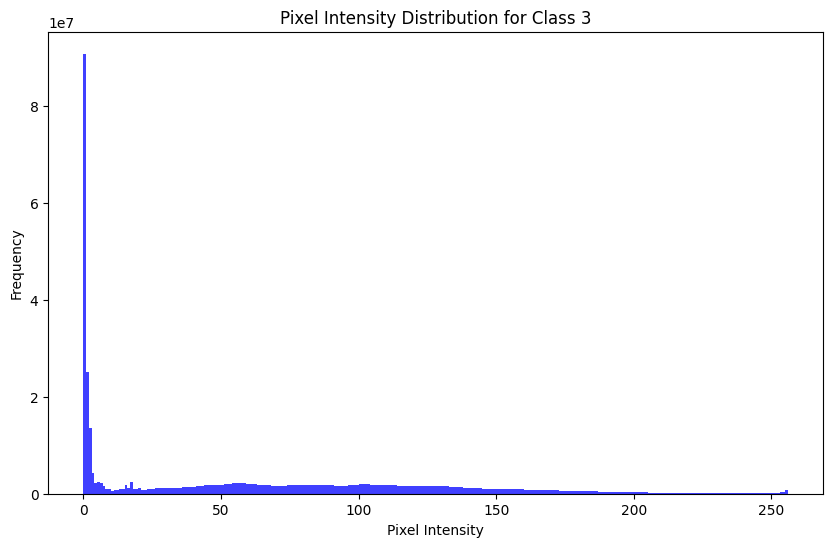

In [20]:
plot_intensity_distribution(train_dir, '3')

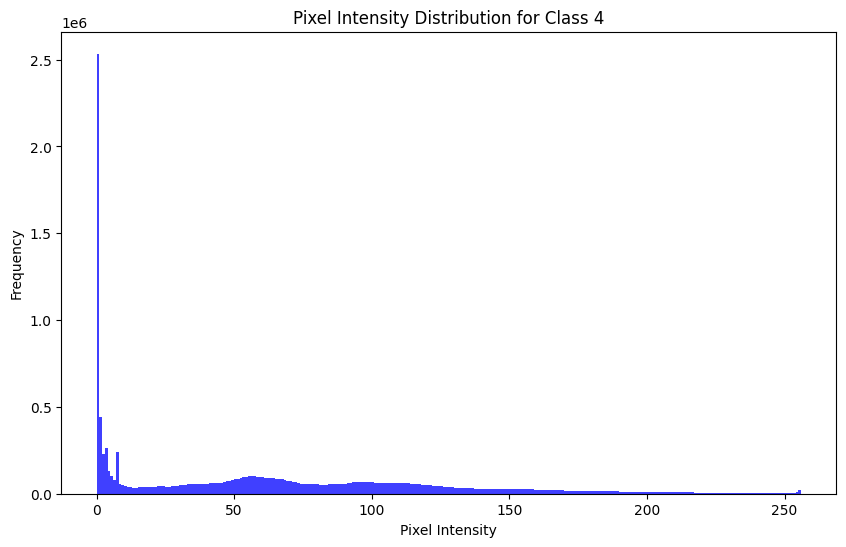

In [21]:
plot_intensity_distribution(train_dir, '4')

<div style="border-radius:10px; border:#808080 dashed; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=brown> 🔍 Inference:</font></h3>

- **A peak around the lower intensity values indicates darker areas** 
- **The spread of pixel intensities across the histogram can indicate the contrast present in images** 

<center><div style='color:#ffffff;
           display:inline-block;
           padding: 5px 5px 5px 5px;
           border-radius:5px;
           background-color:#78D1E1;
           font-size:100%;'><a href=#toc style='text-decoration: none; color:#03001C;'>⬆️ Back To Top</a></div></center>
           
<a id='3.5'></a>
## **Checking the aspect ratio of the images to ensure consistency**

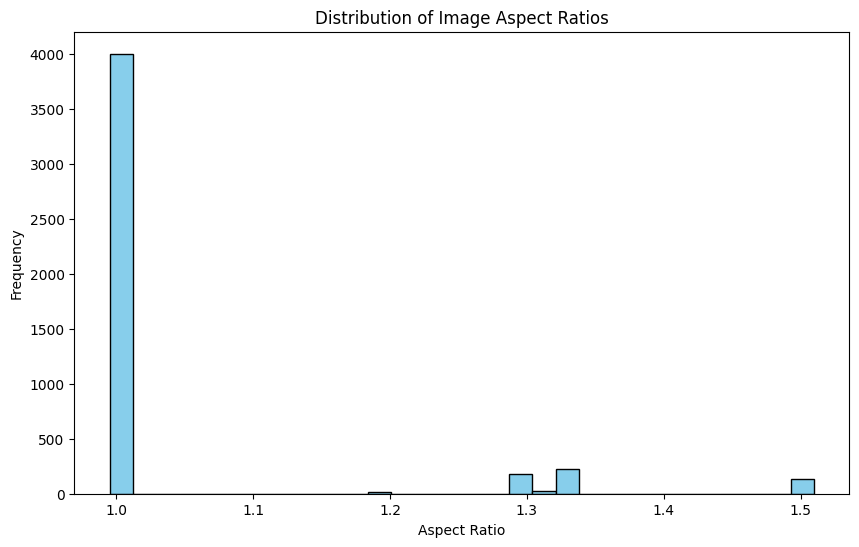

In [22]:
aspect_ratios = [width / height for width, height in image_dimensions]

plt.figure(figsize=(10, 6))
plt.hist(aspect_ratios, bins=30, color='skyblue', edgecolor='black')
plt.xlabel('Aspect Ratio')
plt.ylabel('Frequency')
plt.title('Distribution of Image Aspect Ratios')
plt.show()

<div style="border-radius:10px; border:#808080 dashed; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=brown> 🔍 Inference:</font></h3>

- **Most of the Image have Aspect ratio of 1 which shows consistency** 

<center><div style='color:#ffffff;
           display:inline-block;
           padding: 5px 5px 5px 5px;
           border-radius:5px;
           background-color:#78D1E1;
           font-size:100%;'><a href=#toc style='text-decoration: none; color:#03001C;'>⬆️ Back To Top</a></div></center>

<a id='4'></a>
# 4 | Preprocessing

<div style="padding: 4px;color:white;margin:10;font-size:200%;text-align:center;display:fill;border-radius:10px;overflow:hidden;background-image: url(https://i.postimg.cc/fTDmwnkQ/Miaka.png); background-size: 100% auto;"></div>


<a id='4.1'></a>
## **Data Augmentation and preprocessing of training data and Testing data** 

In [23]:
#Performing data Augmentation
batch_size = 32

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Only rescaling for test data
test_datagen = ImageDataGenerator(rescale=1./255)


train_generator = train_datagen.flow_from_directory(
    directory='/kaggle/input/cleaned-data/cleaned_data/train',
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='categorical'  
)

test_generator = test_datagen.flow_from_directory(
        '/kaggle/input/cleaned-data/cleaned_data/test',
        target_size=(224, 224),
        batch_size=batch_size,
        class_mode='categorical'  
        )

Found 4588 images belonging to 5 classes.
Found 1150 images belonging to 5 classes.


<center><div style='color:#ffffff;
           display:inline-block;
           padding: 5px 5px 5px 5px;
           border-radius:5px;
           background-color:#78D1E1;
           font-size:100%;'><a href=#toc style='text-decoration: none; color:#03001C;'>⬆️ Back To Top</a></div></center>

<a id='5'></a>
# 5 | Model Building 

<div style="padding: 4px;color:white;margin:10;font-size:200%;text-align:center;display:fill;border-radius:10px;overflow:hidden;background-image: url(https://i.postimg.cc/fTDmwnkQ/Miaka.png); background-size: 100% auto;"></div>


<a id='5.1'></a>
## **Baseline Model Building** 

In [24]:
# create baseline CNN model
CNN_model = Sequential()

CNN_model.add(Conv2D(64,kernel_size=(3,3),padding='same',activation='relu',input_shape=(224,224,3),kernel_regularizer=tf.keras.regularizers.l2(0.001),kernel_initializer='he_normal'))
CNN_model.add(BatchNormalization())
CNN_model.add(MaxPooling2D(pool_size=(2,2),padding='same'))

CNN_model.add(Conv2D(128,kernel_size=(3,3),padding='same',activation='relu',kernel_regularizer=tf.keras.regularizers.l2(0.001),kernel_initializer='he_normal'))
CNN_model.add(BatchNormalization())
CNN_model.add(MaxPooling2D(pool_size=(2,2),padding='same'))

CNN_model.add(Conv2D(256,kernel_size=(3,3),padding='same',activation='relu',kernel_regularizer=tf.keras.regularizers.l2(0.001),kernel_initializer='he_normal'))
CNN_model.add(BatchNormalization())
CNN_model.add(MaxPooling2D(pool_size=(2,2),padding='same'))

CNN_model.add(Flatten())

CNN_model.add(Dense(16,activation='relu',kernel_regularizer=tf.keras.regularizers.l2(0.001),kernel_initializer='he_normal'))
CNN_model.add(BatchNormalization())

CNN_model.add(Dense(5,activation='softmax'))

CNN_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 112, 112, 128)  │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 56, 56, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 200704)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 16)             │     3,211,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 16)             │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │            85 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,584,037 (13.67 MB)

 Trainable params: 3,583,109 (13.67 MB)

 Non-trainable params: 928 (3.62 KB)

In [25]:
from tensorflow.keras.optimizers import Adadelta
optimizer = Adadelta(learning_rate=1.0, rho=0.95)

CNN_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])


In [26]:
early_stopping_cb = tf.keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True)

CALLBACKS = [early_stopping_cb]

In [27]:
history = CNN_model.fit(
    train_generator,
    callbacks=CALLBACKS,
    epochs=30,
    validation_data=test_generator
)

Epoch 1/30
  1/144 ━━━━━━━━━━━━━━━━━━━━ 1:06:28 28s/step - accuracy: 0.3750 - loss: 2.8476

I0000 00:00:1716385742.572334      89 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1716385742.591831      89 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


144/144 ━━━━━━━━━━━━━━━━━━━━ 0s 853ms/step - accuracy: 0.3666 - loss: 2.5757

W0000 00:00:1716385867.041689      89 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


144/144 ━━━━━━━━━━━━━━━━━━━━ 176s 1s/step - accuracy: 0.3672 - loss: 2.5738 - val_accuracy: 0.5643 - val_loss: 2.0294
Epoch 2/30
144/144 ━━━━━━━━━━━━━━━━━━━━ 92s 616ms/step - accuracy: 0.5924 - loss: 1.8379 - val_accuracy: 0.5565 - val_loss: 1.7209
Epoch 3/30
144/144 ━━━━━━━━━━━━━━━━━━━━ 91s 605ms/step - accuracy: 0.5919 - loss: 1.5417 - val_accuracy: 0.5609 - val_loss: 1.4259
Epoch 4/30
144/144 ━━━━━━━━━━━━━━━━━━━━ 89s 590ms/step - accuracy: 0.6060 - loss: 1.3481 - val_accuracy: 0.5861 - val_loss: 1.2818
Epoch 5/30
144/144 ━━━━━━━━━━━━━━━━━━━━ 89s 592ms/step - accuracy: 0.5975 - loss: 1.2467 - val_accuracy: 0.6217 - val_loss: 1.1712
Epoch 6/30
144/144 ━━━━━━━━━━━━━━━━━━━━ 142s 591ms/step - accuracy: 0.6122 - loss: 1.1629 - val_accuracy: 0.5835 - val_loss: 1.1538
Epoch 7/30
144/144 ━━━━━━━━━━━━━━━━━━━━ 91s 606ms/step - accuracy: 0.6013 - loss: 1.1225 - val_accuracy: 0.5557 - val_loss: 1.1480
Epoch 8/30
144/144 ━━━━━━━━━━━━━━━━━━━━ 91s 602ms/step - accuracy: 0.6071 - loss: 1.1106 - val_

In [28]:
CNN_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 112, 112, 128)  │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 56, 56, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 200704)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 16)             │     3,211,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 16)             │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │            85 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,750,257 (41.01 MB)

 Trainable params: 3,583,109 (13.67 MB)

 Non-trainable params: 928 (3.62 KB)

 Optimizer params: 7,166,220 (27.34 MB)

<center><div style='color:#ffffff;
           display:inline-block;
           padding: 5px 5px 5px 5px;
           border-radius:5px;
           background-color:#78D1E1;
           font-size:100%;'><a href=#toc style='text-decoration: none; color:#03001C;'>⬆️ Back To Top</a></div></center>
           
<a id='5.2'></a>
## **Baseline Madel Evaluation** 

In [29]:
Evaluation = CNN_model.evaluate(test_generator)

36/36 ━━━━━━━━━━━━━━━━━━━━ 9s 259ms/step - accuracy: 0.6165 - loss: 1.0349


In [30]:
Custom_CNN_Accuracy = Evaluation[1]*100
print("Accuracy of this model is :" ,Custom_CNN_Accuracy,"%")

Accuracy of this model is : 62.95652389526367 %


In [31]:
# Generate predictions
custom_cnn_predictions = CNN_model.predict(test_generator, steps=test_generator.samples // test_generator.batch_size + 1)
custom_cnn_pred_classes = custom_cnn_predictions.argmax(axis=-1)

 1/36 ━━━━━━━━━━━━━━━━━━━━ 27s 786ms/step

W0000 00:00:1716387231.024333      88 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


36/36 ━━━━━━━━━━━━━━━━━━━━ 10s 261ms/step


In [32]:
# Get true labels
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

In [33]:
from sklearn.metrics import classification_report

report_dict = classification_report(true_classes, custom_cnn_pred_classes, target_names=class_labels, output_dict=True)
report_df = pd.DataFrame(report_dict).transpose()

In [34]:
print(report_df)

              precision    recall  f1-score      support
0              0.262590  0.214706  0.236246   340.000000
1              0.000000  0.000000  0.000000   120.000000
2              0.556193  0.745008  0.636901   651.000000
3              0.000000  0.000000  0.000000    36.000000
4              0.000000  0.000000  0.000000     3.000000
accuracy       0.485217  0.485217  0.485217     0.485217
macro avg      0.163757  0.191943  0.174629  1150.000000
weighted avg   0.392489  0.485217  0.430388  1150.000000


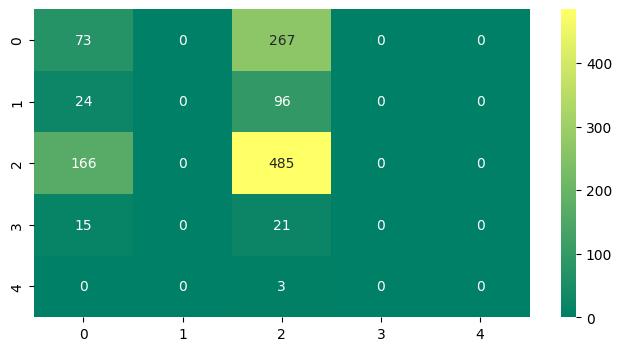

In [35]:
import seaborn as sns
cm = confusion_matrix(true_classes, custom_cnn_pred_classes)
plt.figure(figsize=(8, 4))
sns.heatmap(cm, annot=True, fmt="g", cmap="summer")
plt.show()

<center><div style='color:#ffffff;
           display:inline-block;
           padding: 5px 5px 5px 5px;
           border-radius:5px;
           background-color:#78D1E1;
           font-size:100%;'><a href=#toc style='text-decoration: none; color:#03001C;'>⬆️ Back To Top</a></div></center>

## **Baseline Model Graphs of Accuracy and Loss** 

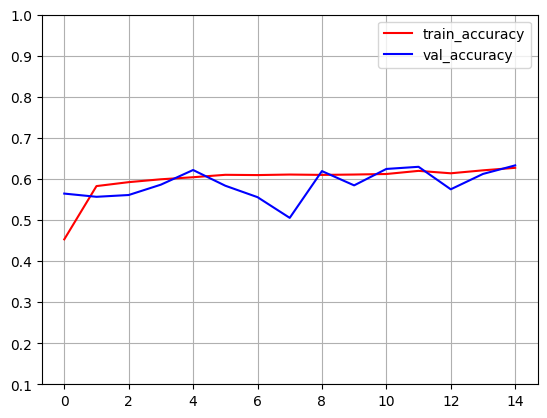

In [36]:
plt.plot(history.history['accuracy'], color='red', label='train_accuracy')
plt.plot(history.history['val_accuracy'], color='blue', label='val_accuracy')
plt.legend()
plt.grid()

plt.ylim(0.1, 1.0)

plt.show()

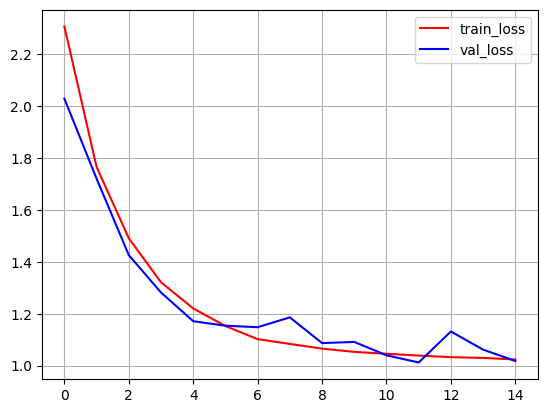

In [37]:
plt.plot(history.history['loss'], color = 'red', label = 'train_loss')
plt.plot(history.history['val_loss'], color = 'blue', label = 'val_loss')
plt.legend()
plt.grid()
plt.plot()
plt.show()

<Axes: >

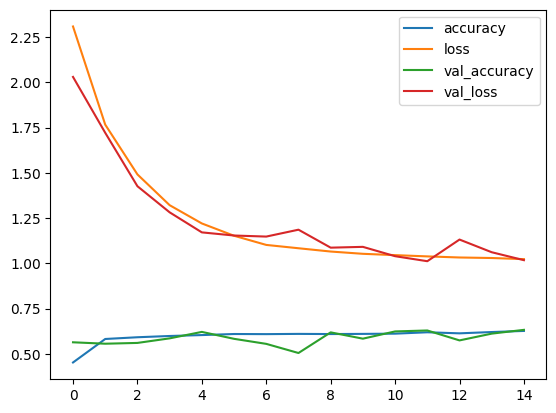

In [38]:
pd.DataFrame(history.history).plot()

<center><div style='color:#ffffff;
           display:inline-block;
           padding: 5px 5px 5px 5px;
           border-radius:5px;
           background-color:#78D1E1;
           font-size:100%;'><a href=#toc style='text-decoration: none; color:#03001C;'>⬆️ Back To Top</a></div></center>
           
<a id='5.3'></a>
# **Transfer Learning InceptionV3** 

In [39]:
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [40]:
# Add custom layers on top of the base model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dense(512, activation='relu')(x)
predictions = Dense(5, activation='softmax')(x) 


In [41]:
# Create the full model
inceptionV3_model = Model(inputs=base_model.input, outputs=predictions)

In [42]:
# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

In [43]:
# Compile the model
inceptionV3_model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

In [44]:
# Train the model
history = inceptionV3_model.fit(
    train_generator,
    epochs=30,
    validation_data=test_generator,
    steps_per_epoch=train_generator.samples // 64,
    validation_steps=test_generator.samples // 64
)

Epoch 1/30
 2/71 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - accuracy: 0.3828 - loss: 1.5004  

W0000 00:00:1716387285.290152      88 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


53/71 ━━━━━━━━━━━━━━━━━━━━ 13s 755ms/step - accuracy: 0.5482 - loss: 1.1201

W0000 00:00:1716387324.395385      89 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 698ms/step - accuracy: 0.5577 - loss: 1.0963

W0000 00:00:1716387341.236185      90 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


71/71 ━━━━━━━━━━━━━━━━━━━━ 88s 858ms/step - accuracy: 0.5580 - loss: 1.0953 - val_accuracy: 0.6195 - val_loss: 0.9388
Epoch 2/30
71/71 ━━━━━━━━━━━━━━━━━━━━ 38s 543ms/step - accuracy: 0.6190 - loss: 0.9598 - val_accuracy: 0.6158 - val_loss: 0.9288
Epoch 3/30
71/71 ━━━━━━━━━━━━━━━━━━━━ 14s 205ms/step - accuracy: 0.5775 - loss: 1.0273 - val_accuracy: 0.5968 - val_loss: 1.0185
Epoch 4/30


W0000 00:00:1716387397.868280      90 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


71/71 ━━━━━━━━━━━━━━━━━━━━ 50s 629ms/step - accuracy: 0.6198 - loss: 0.9231 - val_accuracy: 0.6967 - val_loss: 0.8431
Epoch 5/30
71/71 ━━━━━━━━━━━━━━━━━━━━ 40s 575ms/step - accuracy: 0.6193 - loss: 0.9191 - val_accuracy: 0.6397 - val_loss: 0.8996
Epoch 6/30
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7658 - loss: 0.6854 - val_accuracy: 0.7903 - val_loss: 0.6629
Epoch 7/30
71/71 ━━━━━━━━━━━━━━━━━━━━ 49s 629ms/step - accuracy: 0.6513 - loss: 0.8661 - val_accuracy: 0.6581 - val_loss: 0.8579
Epoch 8/30
71/71 ━━━━━━━━━━━━━━━━━━━━ 40s 570ms/step - accuracy: 0.6311 - loss: 0.8753 - val_accuracy: 0.6489 - val_loss: 0.8745
Epoch 9/30
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7192 - loss: 0.7291 - val_accuracy: 0.7581 - val_loss: 0.6729
Epoch 10/30
71/71 ━━━━━━━━━━━━━━━━━━━━ 47s 613ms/step - accuracy: 0.6530 - loss: 0.8519 - val_accuracy: 0.6397 - val_loss: 0.8694
Epoch 11/30
71/71 ━━━━━━━━━━━━━━━━━━━━ 41s 582ms/step - accuracy: 0.6607 - loss: 0.8365 - val_accuracy: 0.6471 - 

In [45]:
# Unfreeze some layers of the base model for fine-tuning
for layer in base_model.layers[-50:]:  # unfreezing the last 50 layers
    layer.trainable = True

In [46]:
# Compile the model again
inceptionV3_model.compile(optimizer=Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

In [47]:
# Continue training the model
history = inceptionV3_model.fit(
    train_generator,
    epochs=30,
    validation_data=test_generator,
    steps_per_epoch=train_generator.samples // 64,
    validation_steps=test_generator.samples // 64
)

Epoch 1/30
 2/71 ━━━━━━━━━━━━━━━━━━━━ 7s 108ms/step - accuracy: 0.5547 - loss: 1.0963 

W0000 00:00:1716388244.660263      90 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


22/71 ━━━━━━━━━━━━━━━━━━━━ 1:05 1s/step - accuracy: 0.5836 - loss: 1.0330

W0000 00:00:1716388272.632678      91 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 886ms/step - accuracy: 0.6123 - loss: 0.9591

W0000 00:00:1716388313.462549      88 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


71/71 ━━━━━━━━━━━━━━━━━━━━ 102s 1s/step - accuracy: 0.6126 - loss: 0.9583 - val_accuracy: 0.6691 - val_loss: 0.7905
Epoch 2/30
71/71 ━━━━━━━━━━━━━━━━━━━━ 39s 552ms/step - accuracy: 0.6457 - loss: 0.8490 - val_accuracy: 0.6746 - val_loss: 0.8187
Epoch 3/30
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - accuracy: 0.6558 - loss: 0.7867 - val_accuracy: 0.7097 - val_loss: 0.9706
Epoch 4/30


W0000 00:00:1716388359.778904      88 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


71/71 ━━━━━━━━━━━━━━━━━━━━ 48s 613ms/step - accuracy: 0.6690 - loss: 0.8265 - val_accuracy: 0.6765 - val_loss: 0.7750
Epoch 5/30
71/71 ━━━━━━━━━━━━━━━━━━━━ 41s 586ms/step - accuracy: 0.6540 - loss: 0.8393 - val_accuracy: 0.6618 - val_loss: 0.8256
Epoch 6/30
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.6857 - loss: 0.8076 - val_accuracy: 0.7097 - val_loss: 0.7788
Epoch 7/30
71/71 ━━━━━━━━━━━━━━━━━━━━ 49s 638ms/step - accuracy: 0.6681 - loss: 0.8234 - val_accuracy: 0.6526 - val_loss: 0.8256
Epoch 8/30
71/71 ━━━━━━━━━━━━━━━━━━━━ 40s 572ms/step - accuracy: 0.6423 - loss: 0.8631 - val_accuracy: 0.6618 - val_loss: 0.8408
Epoch 9/30
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6857 - loss: 0.7754 - val_accuracy: 0.6774 - val_loss: 0.7667
Epoch 10/30
71/71 ━━━━━━━━━━━━━━━━━━━━ 49s 631ms/step - accuracy: 0.6702 - loss: 0.8174 - val_accuracy: 0.6654 - val_loss: 0.8002
Epoch 11/30
71/71 ━━━━━━━━━━━━━━━━━━━━ 41s 577ms/step - accuracy: 0.6793 - loss: 0.7685 - val_accuracy: 0.7040 - 

<center><div style='color:#ffffff;
           display:inline-block;
           padding: 5px 5px 5px 5px;
           border-radius:5px;
           background-color:#78D1E1;
           font-size:100%;'><a href=#toc style='text-decoration: none; color:#03001C;'>⬆️ Back To Top</a></div></center>
           
<a id='5.4'></a>
# **Evaluating InceptionV3 Model** 

In [48]:
Evaluation = inceptionV3_model.evaluate(test_generator)

36/36 ━━━━━━━━━━━━━━━━━━━━ 10s 262ms/step - accuracy: 0.6695 - loss: 0.8044


In [49]:
InceptionV3_Accuracy = Evaluation[1]*100
print("Accuracy of inceptionV3_model is :" ,InceptionV3_Accuracy,"%")

Accuracy of inceptionV3_model is : 67.73912906646729 %


In [50]:
# Generate predictions
InceptionV3_predictions = inceptionV3_model.predict(test_generator, steps=test_generator.samples // test_generator.batch_size + 1)
InceptionV3_pred_classes = InceptionV3_predictions.argmax(axis=-1)

 2/36 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step

W0000 00:00:1716389199.561916      89 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


36/36 ━━━━━━━━━━━━━━━━━━━━ 21s 417ms/step


W0000 00:00:1716389214.155391      90 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


In [51]:
# Generate classification report
report_dict = classification_report(true_classes, InceptionV3_pred_classes, target_names=class_labels, output_dict=True)
report_df = pd.DataFrame(report_dict).transpose()

In [52]:
print(report_df)

              precision    recall  f1-score      support
0              0.289030  0.402941  0.336609   340.000000
1              0.142857  0.025000  0.042553   120.000000
2              0.590980  0.583717  0.587326   651.000000
3              0.000000  0.000000  0.000000    36.000000
4              0.000000  0.000000  0.000000     3.000000
accuracy       0.452174  0.452174  0.452174     0.452174
macro avg      0.204573  0.202332  0.193298  1150.000000
weighted avg   0.434905  0.452174  0.436437  1150.000000


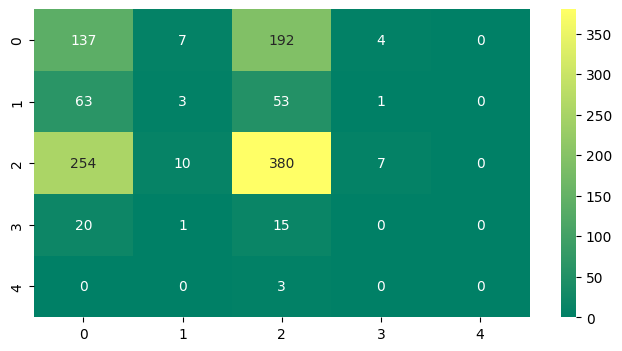

In [53]:
import seaborn as sns
cm = confusion_matrix(true_classes, InceptionV3_pred_classes)
plt.figure(figsize=(8, 4))
sns.heatmap(cm, annot=True, fmt="g", cmap="summer")
plt.show()

<center><div style='color:#ffffff;
           display:inline-block;
           padding: 5px 5px 5px 5px;
           border-radius:5px;
           background-color:#78D1E1;
           font-size:100%;'><a href=#toc style='text-decoration: none; color:#03001C;'>⬆️ Back To Top</a></div></center>

# **InceptionV3 Model Graphs of Accuracy and Loss** 

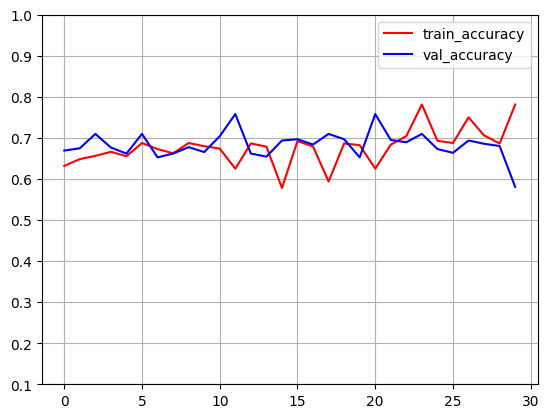

In [54]:
plt.plot(history.history['accuracy'], color='red', label='train_accuracy')
plt.plot(history.history['val_accuracy'], color='blue', label='val_accuracy')
plt.legend()
plt.grid()

plt.ylim(0.1, 1.0)

plt.show()

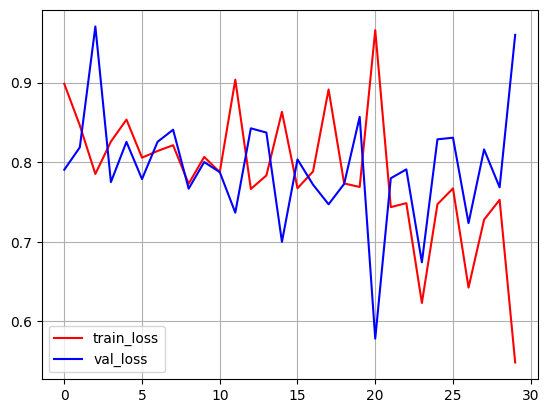

In [55]:
plt.plot(history.history['loss'], color = 'red', label = 'train_loss')
plt.plot(history.history['val_loss'], color = 'blue', label = 'val_loss')
plt.legend()
plt.grid()
plt.plot()
plt.show()

<Axes: >

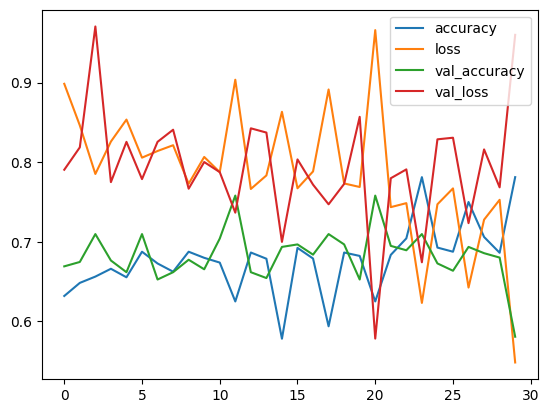

In [56]:
pd.DataFrame(history.history).plot()

<center><div style='color:#ffffff;
           display:inline-block;
           padding: 5px 5px 5px 5px;
           border-radius:5px;
           background-color:#78D1E1;
           font-size:100%;'><a href=#toc style='text-decoration: none; color:#03001C;'>⬆️ Back To Top</a></div></center>
           
<a id='5.5'></a>
# **Comparision Between both Model accuracy** 

In [57]:
# Create a DataFrame with these accuracy scores
data = {
    'Model': ['CNN', 'InceptionV3'],
    'Accuracy': [Custom_CNN_Accuracy, InceptionV3_Accuracy]
}
Acc_df = pd.DataFrame(data)

In [58]:
Acc_df

,Model,Accuracy
0,CNN,62.956524
1,InceptionV3,67.739129


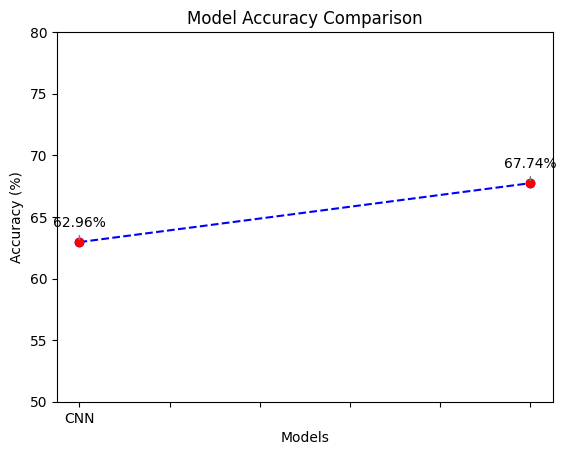

In [59]:
# Plot the DataFrame
ax = Acc_df.plot(x='Model', y='Accuracy', marker='o', linestyle='dashed', color='b', legend=False)

ax.set_xlabel('Models')
ax.set_ylabel('Accuracy (%)')
ax.set_title('Model Accuracy Comparison')
ax.set_ylim(50, 80)  

for i, accuracy in enumerate(Acc_df['Accuracy']):
    ax.annotate(f'{accuracy:.2f}%', xy=(i, accuracy), xytext=(i, accuracy + 1),
                ha='center', va='bottom', fontsize=10, color='black',
                arrowprops=dict(arrowstyle='-', color='gray'))
    ax.plot(i, accuracy, 'ro')

# Show the plot
plt.show()

<a id='5.6'></a>
# **Prediction On random samples** 

<center><div style='color:#ffffff;
           display:inline-block;
           padding: 5px 5px 5px 5px;
           border-radius:5px;
           background-color:#78D1E1;
           font-size:100%;'><a href=#toc style='text-decoration: none; color:#03001C;'>⬆️ Back To Top</a></div></center>
           
## **Predicition on class 0 image**

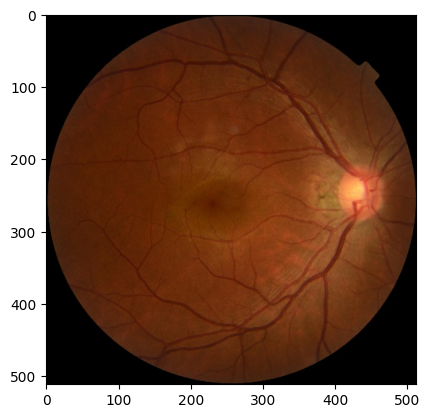

In [60]:
path = '/kaggle/input/cleaned-data/cleaned_data/train/0/007-0007-000.jpg'

Class_0_image = mpimg.imread(path)

Class_0_image_normalized = Class_0_image / 255.0

resized_image = cv2.resize(Class_0_image_normalized, (224, 224))

resized_image = resized_image.reshape(-1, 224, 224, 3)

resized_image = resized_image.astype(np.float32)

plt.imshow(Class_0_image_normalized)
plt.axis('on')
plt.show()

In [61]:
predictions = inceptionV3_model.predict(resized_image)

1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step


In [62]:
predicted_class_index = np.argmax(predictions, axis=-1)

In [63]:
predicted_class_label = class_labels[predicted_class_index[0]]

print(f"Predicted class index: {predicted_class_index[0]}")
print(f"Predicted class label: {predicted_class_label}")

Predicted class index: 0
Predicted class label: 0


<center><div style='color:#ffffff;
           display:inline-block;
           padding: 5px 5px 5px 5px;
           border-radius:5px;
           background-color:#78D1E1;
           font-size:100%;'><a href=#toc style='text-decoration: none; color:#03001C;'>⬆️ Back To Top</a></div></center>
           
## **Predicition on class 1 image**

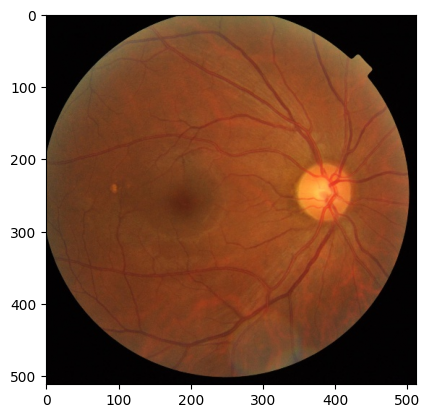

In [64]:
path = '/kaggle/input/cleaned-data/cleaned_data/train/1/007-0033-000.jpg'

Class_1_image = mpimg.imread(path)

Class_1_image_normalized = Class_1_image / 255.0

resized_image = cv2.resize(Class_1_image_normalized, (224, 224))

resized_image = resized_image.reshape(-1, 224, 224, 3)

resized_image = resized_image.astype(np.float32)

plt.imshow(Class_1_image_normalized)
plt.axis('on')
plt.show()

In [65]:
predictions = inceptionV3_model.predict(resized_image)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


In [66]:
predicted_class_index = np.argmax(predictions, axis=-1)

In [67]:
predicted_class_label = class_labels[predicted_class_index[0]]

print(f"Predicted class index: {predicted_class_index[0]}")
print(f"Predicted class label: {predicted_class_label}")

Predicted class index: 0
Predicted class label: 0


<center><div style='color:#ffffff;
           display:inline-block;
           padding: 5px 5px 5px 5px;
           border-radius:5px;
           background-color:#78D1E1;
           font-size:100%;'><a href=#toc style='text-decoration: none; color:#03001C;'>⬆️ Back To Top</a></div></center>
           
## **Predicition on class 2 image**

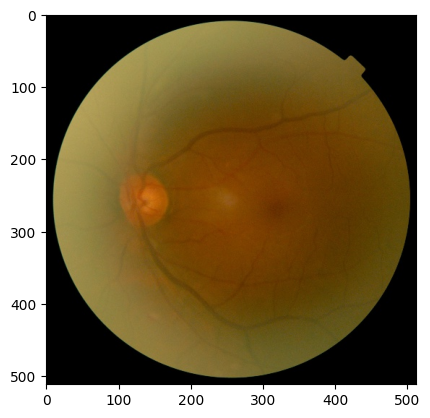

In [68]:
path = '/kaggle/input/cleaned-data/cleaned_data/train/2/007-0139-000.jpg'

Class_2_image = mpimg.imread(path)

Class_2_image_normalized = Class_2_image / 255.0

resized_image = cv2.resize(Class_2_image_normalized, (224, 224))

resized_image = resized_image.reshape(-1, 224, 224, 3)

resized_image = resized_image.astype(np.float32)

plt.imshow(Class_2_image_normalized)
plt.axis('on')
plt.show()

In [69]:
predictions = inceptionV3_model.predict(resized_image)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


In [70]:
predicted_class_index = np.argmax(predictions, axis=-1)

In [71]:
predicted_class_label = class_labels[predicted_class_index[0]]

print(f"Predicted class index: {predicted_class_index[0]}")
print(f"Predicted class label: {predicted_class_label}")

Predicted class index: 2
Predicted class label: 2


<center><div style='color:#ffffff;
           display:inline-block;
           padding: 5px 5px 5px 5px;
           border-radius:5px;
           background-color:#78D1E1;
           font-size:100%;'><a href=#toc style='text-decoration: none; color:#03001C;'>⬆️ Back To Top</a></div></center>
           
<div style="color:white;padding: 30px;color:white;margin:30;font-size:120%;text-align:center;display:fill;border-radius:10px;overflow:hidden;background-image: url(https://i.postimg.cc/fTDmwnkQ/Miaka.png); background-size: 100% auto;background-position: 0px 0px;">
    <center>
    <h3><span style='color:white'>
        Thank you for taking the time to view this notebook!</span>🙏</h3>
    </center>
</div>